# Marketing Analytics: Segmentação de Clientes de uma rede Food Delivery

A segmentação de clientes é o processo de dividir os clientes em grupos com base em características comuns, para que as empresas possam comercializar para cada grupo de forma eficaz e adequada, ou simplesmente compreender o padrão de consumo dos clientes.

Marketing Analytics reúne dados de todos os canais de marketing e os consolida em uma visão de marketing comum. A partir dessa visão comum, você pode extrair resultados analíticos que podem fornecer assistência inestimável para impulsionar os esforços de marketing.

>**Referências:** Formação Cientista de Dados (Data Science Academy)

In [10]:
# Gravação de versões de outros pacotes usados
!pip install -q -U watermark

In [79]:
# Carregando os pacotes
# Manipulação e visualização de dados
import time
import sklearn
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as m
import matplotlib.pyplot as plt

# Machine Learning
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler

# Formatação dos gráficos
plt.style.use('fivethirtyeight')
plt.figure(1, figsize = (15,6))
%matplotlib inline

# Versão dos pacotes
%reload_ext watermark
%watermark -a 'Alberto Araujo' --iversions

# Remover avisos
import warnings
warnings.filterwarnings("ignore")


Author: Alberto Araujo

numpy     : 1.26.4
matplotlib: 3.7.1
pandas    : 2.1.4
sklearn   : 1.3.2
seaborn   : 0.13.1



<Figure size 1500x600 with 0 Axes>

In [16]:
# Carregando e compreendendo os dados
df = pd.read_csv('/content/dataset.csv', encoding = 'utf-8')

In [17]:
# Verificando as dimensões do dataset
df.shape

(260645, 7)

In [14]:
# Visualizando as primeiras observações
df.head()

,id_transacao,horario_pedido,localidade,nome_item,quantidade_item,latitude,longitude
0,0x7901ee,2019-01-16 18:33:00,7,bebida,2,41.794132,-88.010140
1,0x7901ee,2019-01-16 18:33:00,7,pizza,2,41.794132,-88.010140
2,0x7901ee,2019-01-16 18:33:00,7,sobremesa,2,41.794132,-88.010140
3,0x12b47f,2019-09-04 12:36:00,3,salada,1,41.884490,-87.627059
4,0x12b47f,2019-09-04 12:36:00,3,sobremesa,1,41.884490,-87.627059


In [26]:
# Verificando os valores únicos por colunas
df.nunique()

,0
id_transacao,100000
horario_pedido,76799
localidade,9
nome_item,4
quantidade_item,5
latitude,9
longitude,9


In [27]:
# Verificando os tipos de dados
df.dtypes

,0
id_transacao,object
horario_pedido,object
localidade,int64
nome_item,object
quantidade_item,int64
latitude,float64
longitude,float64


In [28]:
# Resumo estatístico das colunas numéricas
df.describe()

,localidade,quantidade_item,latitude,longitude
count,260645.000000,260645.000000,260645.000000,260645.000000
mean,5.134904,2.447010,41.836095,-87.733930
std,2.551846,1.330863,0.144459,0.136369
min,1.000000,1.000000,41.524598,-88.010140
25%,3.000000,1.000000,41.784576,-87.849468
50%,5.000000,2.000000,41.881818,-87.677606
75%,7.000000,4.000000,41.889047,-87.627059
max,9.000000,5.000000,42.049306,-87.607565


In [31]:
%%time

total_pedidos = []

# Extraíndo cada id e cada grupo por id_transacao
for k, group in df.groupby('id_transacao'):

  # Extraíndo cada id e cada grupo por horário_pedido
  for m, n in group.groupby('horario_pedido'):

    # Extraíndo cada item de cada grupo
    id_transacao = k
    horario_pedido = m
    localidade = n['localidade'].values.tolist()[0]
    bebida = 0
    pizza = 0
    sobremesa = 0
    salada = 0
    n = n.reset_index(drop = True)

    # Contabilizar os itens pedidos
    for i in range(len(n)):
      item = n.loc[i, 'nome_item']
      num = n.loc[i, 'quantidade_item']

      if item == 'bebida':
        bebida = bebida + num

      elif item == 'pizza':
        pizza = pizza + num

      elif item == 'sobremesa':
        sobremesa = sobremesa + num

      elif item == 'salada':
        salada = salada + num

    output = [id_transacao, horario_pedido, localidade, bebida, pizza, sobremesa, salada]
    total_pedidos.append(output)

print('Agrupamento concluído!')

Agrupamento concluído!
CPU times: user 1min 46s, sys: 1.34 s, total: 1min 47s
Wall time: 2min


In [33]:
# Convertendo a lista para dataframe
df_itens = pd.DataFrame(total_pedidos)
df_itens.columns = ['id_transacao', 'horario_pedido', 'localidade',
                    'bebida', 'pizza', 'sobremesa', 'salada']
df_itens.shape

(100000, 7)

In [34]:
# Verificando os valores únicos
df_itens.nunique()

,0
id_transacao,100000
horario_pedido,76799
localidade,9
bebida,6
pizza,6
sobremesa,5
salada,6


In [35]:
# Visualizando a nova estrutura da tabela
df_itens.head()

,id_transacao,horario_pedido,localidade,bebida,pizza,sobremesa,salada
0,0x10000a,2019-01-29 00:48:00,9,0,1,1,0
1,0x100058,2019-05-05 00:08:00,6,0,2,2,0
2,0x1000c8,2019-01-28 19:24:00,9,4,4,5,1
3,0x10014c,2019-02-23 00:15:00,6,0,1,1,0
4,0x1001d8,2019-06-30 17:50:00,2,3,3,3,0


In [38]:
# Outra maneira de pivotar a tabela
df_itens_pivot = df.pivot_table(index = ['id_transacao'],
                                columns = 'nome_item',
                                values = 'quantidade_item')

# Tranformando os valores NA por 0 e índice em coluna
df_itens_pivot = df_itens_pivot.fillna(0).reset_index()

In [39]:
# Visualizando as observações
df_itens_pivot

nome_item,id_transacao,bebida,pizza,salada,sobremesa
0,0x10000a,0.0,1.0,0.0,1.0
1,0x100058,0.0,2.0,0.0,2.0
2,0x1000c8,4.0,4.0,1.0,5.0
3,0x10014c,0.0,1.0,0.0,1.0
4,0x1001d8,3.0,3.0,0.0,3.0
...,...,...,...,...,...
99995,0xffe96,4.0,4.0,0.0,4.0
99996,0xffeed,0.0,1.0,0.0,1.0
99997,0xfff07,1.0,1.0,0.0,1.0
99998,0xfff4d,0.0,2.0,0.0,2.0


In [40]:
# Valores únicos
df_itens_pivot.nunique()

,0
nome_item,
id_transacao,100000
bebida,6
pizza,6
salada,6
sobremesa,5


In [41]:
# Resumo estatístico
df_itens_pivot.describe()

nome_item,bebida,pizza,salada,sobremesa
count,100000.000000,100000.000000,100000.000000,100000.000000
mean,1.239590,1.857840,0.711370,2.569210
std,1.627886,1.588589,1.086524,1.332084
min,0.000000,0.000000,0.000000,1.000000
25%,0.000000,1.000000,0.000000,1.000000
50%,0.000000,1.000000,0.000000,2.000000
75%,3.000000,3.000000,1.000000,4.000000
max,5.000000,5.000000,5.000000,5.000000


In [42]:
# Verificando os valores nulos por coluna
df_itens_pivot.isnull().sum()

,0
nome_item,
id_transacao,0
bebida,0
pizza,0
salada,0
sobremesa,0


In [43]:
# Adicionando a coluna de localidade
df_itens_pivot = df_itens_pivot.merge(df[['id_transacao','localidade']])

In [46]:
# Verificando as observações modificadas
df_itens_pivot.sample(10)

,id_transacao,bebida,pizza,salada,sobremesa,localidade
168953,0x689851,4.0,4.0,0.0,4.0,8
23388,0x1c5688,1.0,4.0,0.0,4.0,2
167003,0x679e86,0.0,0.0,3.0,3.0,6
91636,0x3fd930,0.0,0.0,3.0,3.0,3
173508,0x6ae97a,1.0,1.0,0.0,1.0,4
141179,0x5a1085,0.0,2.0,0.0,2.0,6
113350,0x4b4f74,2.0,2.0,0.0,2.0,9
192517,0x750599,0.0,1.0,0.0,1.0,8
168449,0x68596d,3.0,4.0,0.0,4.0,8
54140,0x2c4fba,1.0,1.0,1.0,2.0,3


In [58]:
#transformando a coluna horario_pedido em datetime
df_itens['horario_pedido'] = pd.to_datetime(df_itens['horario_pedido'])
df_itens['mes'] = df_itens['horario_pedido'].dt.month
df_itens['dia'] = df_itens['horario_pedido'].dt.day

In [62]:
# Mesclando com o df pivotado
df_itens_pivot = df_itens_pivot.merge(df_itens[['id_transacao','mes','dia']])

In [64]:
# Verificando a nova estrutura
df_itens_pivot.head()

,id_transacao,bebida,pizza,salada,sobremesa,localidade,mes,dia
0,0x10000a,0.0,1.0,0.0,1.0,9,1,29
1,0x10000a,0.0,1.0,0.0,1.0,9,1,29
2,0x100058,0.0,2.0,0.0,2.0,6,5,5
3,0x100058,0.0,2.0,0.0,2.0,6,5,5
4,0x1000c8,4.0,4.0,1.0,5.0,9,1,28


In [65]:
# Conferindo os valores únicos
df_itens_pivot.nunique()

,0
id_transacao,100000
bebida,6
pizza,6
salada,6
sobremesa,5
localidade,9
mes,12
dia,31


In [68]:
# Fazendo o reset do index e gravando em outro dataframe
df_itens_index = df_itens.reset_index()

In [70]:
df_itens_index.head()

,index,id_transacao,horario_pedido,localidade,bebida,pizza,sobremesa,salada,mes,dia
0,0,0x10000a,2019-01-29 00:48:00,9,0,1,1,0,1,29
1,1,0x100058,2019-05-05 00:08:00,6,0,2,2,0,5,5
2,2,0x1000c8,2019-01-28 19:24:00,9,4,4,5,1,1,28
3,3,0x10014c,2019-02-23 00:15:00,6,0,1,1,0,2,23
4,4,0x1001d8,2019-06-30 17:50:00,2,3,3,3,0,6,30


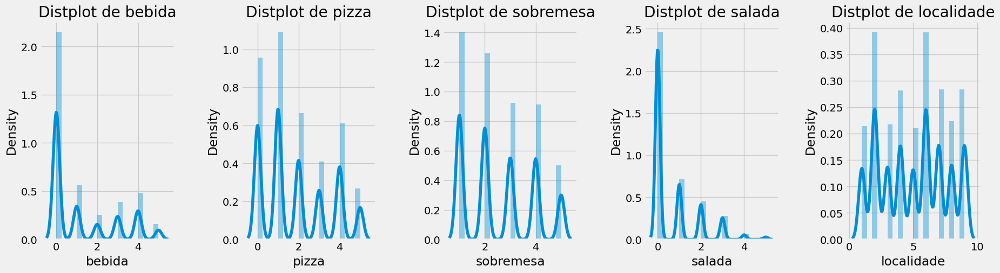

In [80]:
# Plot

# Tamanho da figura
plt.figure(1, figsize = (20,5))

# Inicializa o contador
n = 0

# Loop pelas colunas

for x in {'pizza', 'sobremesa', 'salada', 'bebida', 'localidade'}:
  n += 1
  plt.subplot(1, 5, n)
  plt.subplots_adjust(hspace = 0.5, wspace = 0.5)
  sns.distplot(df_itens[x], bins = 20)
  plt.title('Distplot de {}'.format(x));
plt.show();

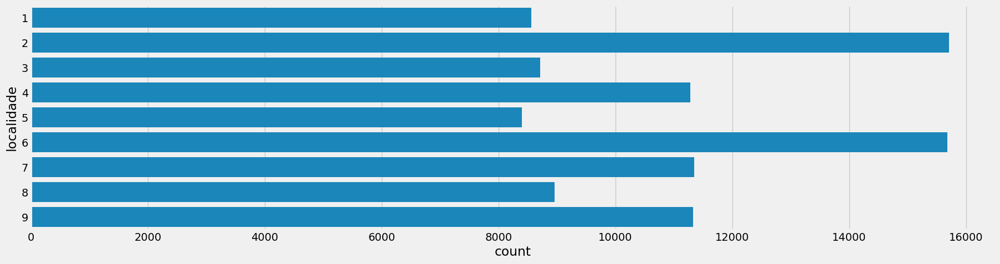

In [81]:
# Total de pedidos por localidade
plt.figure(1, figsize = (20,5))
sns.countplot(y = 'localidade', data = df_itens)
plt.show()

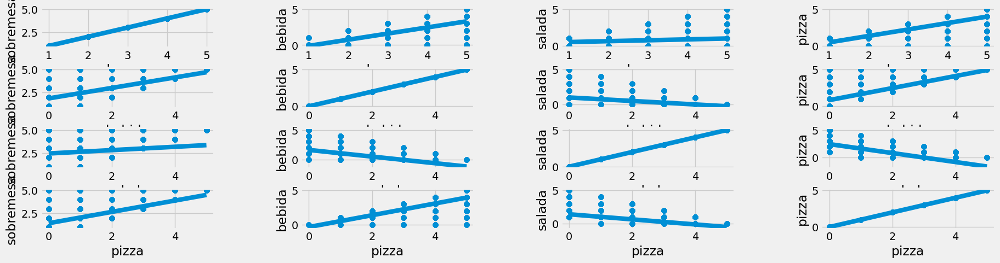

In [84]:
# Plot de Regressão
plt.figure(1, figsize = (20,5))

# Inicia o contador
n = 0

# Loop
for x in {'pizza', 'sobremesa', 'salada', 'bebida'}:
  for y in {'pizza', 'sobremesa', 'salada', 'bebida'}:
    n += 1
    plt.subplot(4, 4, n)
    plt.subplots_adjust(hspace = 0.5, wspace = 0.5)
    sns.regplot(x = x, y = y, data = df_itens)
    plt.ylabel(y)
plt.show();

# 5. Definindo as Variáveis Para Segmentação

Vamos remover id_transacao, horario_pedido, localidade e mes para nossas primeiras atividades de clusterização.

In [128]:
# Filtrando o dataframe
df2 = df_itens_index[['index','bebida','pizza','sobremesa','salada', 'localidade']]
df2.head()

,index,bebida,pizza,sobremesa,salada,localidade
0,0,0,1,1,0,9
1,1,0,2,2,0,6
2,2,4,4,5,1,9
3,3,0,1,1,0,6
4,4,3,3,3,0,2


# 6. Análise de Cluster

Processo de aprendizagem não supervisionada, quando o o algoritmo aprende os padrões dos dados e gera saídas agrupadas em grupos por similaridades, ou chamadas de clusters.

In [91]:
# Segmentação 1
# Pizza e Sobremesa
X1 = df2[['pizza','sobremesa']].iloc[:,:].values

# Lista de WCSS
wcss_X1 = []

In [92]:
# Encontrando o valor ideal de Clusters
# Loop para valores de K
for n in range(2, 11):
  modelo = (KMeans(n_clusters = n,
                   init = 'k-means++',
                   n_init = 10,
                   max_iter = 300,
                   tol = 0.0001,
                   random_state = 111,
                   algorithm = 'elkan'
                   ))
  modelo.fit(X1)
  wcss_X1.append(modelo.inertia_)

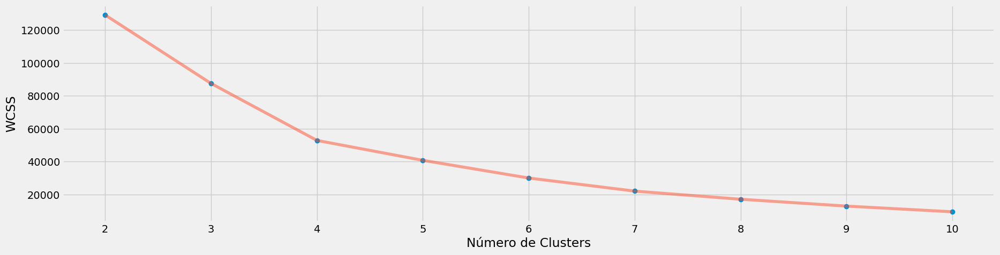

In [94]:
# Plot
plt.figure(1, figsize = (20, 5))
plt.plot(np.arange(2, 11), wcss_X1, 'o')
plt.plot(np.arange(2,11), wcss_X1, '-', alpha = 0.5)
plt.xlabel('Número de Clusters'), plt.ylabel('WCSS')
plt.show()

In [98]:
# Segmentação 1
modelo_seg1 = KMeans(
                n_clusters = 2,
                init = 'k-means++',
                n_init = 10,
                max_iter = 300,
                tol = 0.0001,
                random_state = 111,
                algorithm = 'elkan'
                )

# Treinando o modelo
modelo_seg1.fit(X1)

KMeans(algorithm='elkan', n_clusters=2, n_init=10, random_state=111)

In [ ]:
# Extração dos labels
labels1 = modelo_seg1.labels_
labels1

In [99]:
# Extração dos centróides
centroides1 = modelo_seg1.cluster_centers_
centroides1

array([[0.881644  , 1.82183485],
       [3.79958153, 4.05580631]])

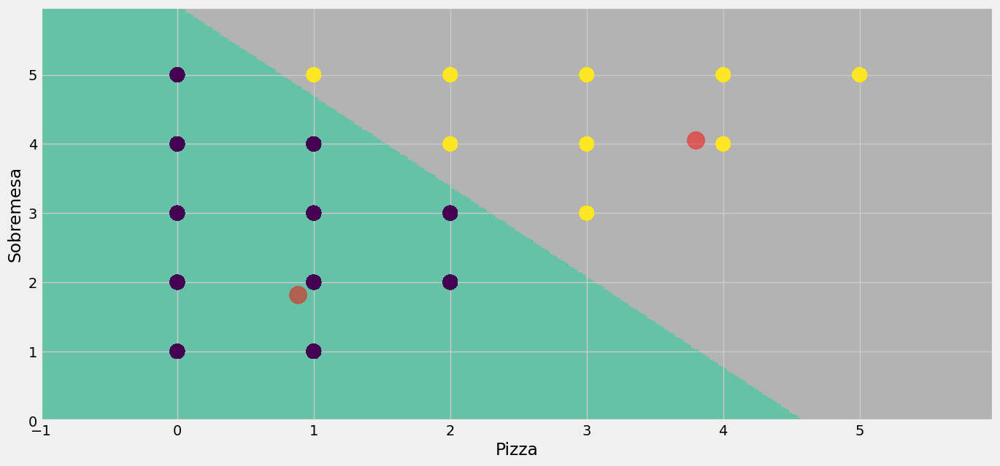

In [116]:
# Plot
# Parâmetros do Meshgrid
h = 0.02
x_min, x_max = X1[:, 0].min() - 1, X1[:, 0].max() + 1
y_min, y_max = X1[:, 1].min() - 1, X1[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = modelo_seg1.predict(np.c_[xx.ravel(), yy.ravel()])
plt.figure(1 , figsize = (15, 7) )
plt.clf()
Z = Z.reshape(xx.shape)

# Plot da imagem
plt.imshow(Z,
           interpolation = 'nearest',
           extent = (xx.min(), xx.max(), yy.min(), yy.max()),
           cmap = plt.cm.Set2,
           aspect = 'auto',
           origin = 'lower')

# Plot dos pontos de dados
plt.scatter( x = 'pizza', y = 'sobremesa', data = df_itens_index, c = labels1, s = 200 )
plt.scatter(x = centroides1[: , 0], y =  centroides1[: , 1], s = 300, c = 'red', alpha = 0.5)
plt.xlabel('Pizza')
plt.ylabel('Sobremesa')
plt.show()

In [122]:
# Segmentação 2
# Pizza e Salada
X2 = df2[['pizza','salada']].iloc[:,:].values

# Lista de WCSS
wcss_X2 = []


# Encontrando o valor ideal de Clusters
# Loop para valores de K
for n in range(2, 11):
  modelo = (KMeans(n_clusters = n,
                   init = 'k-means++',
                   n_init = 10,
                   max_iter = 300,
                   tol = 0.0001,
                   random_state = 111,
                   algorithm = 'elkan'
                   ))
  modelo.fit(X2)
  wcss_X2.append(modelo.inertia_)

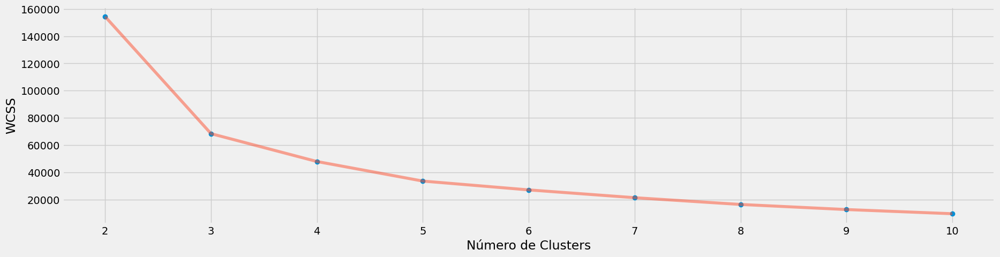

In [123]:
# Plot
plt.figure(1, figsize = (20, 5))
plt.plot(np.arange(2, 11), wcss_X2, 'o')
plt.plot(np.arange(2,11), wcss_X2, '-', alpha = 0.5)
plt.xlabel('Número de Clusters'), plt.ylabel('WCSS')
plt.show()

In [125]:
# Segmentação 2
modelo_seg2 = KMeans(
                n_clusters = 3,
                init = 'k-means++',
                n_init = 10,
                max_iter = 300,
                tol = 0.0001,
                random_state = 111,
                algorithm = 'elkan'
                )

# Treinando o modelo
modelo_seg2.fit(X2)

# Extração dos labels
labels2 = modelo_seg2.labels_
labels2

# Extração dos centróides
centroides2 = modelo_seg2.cluster_centers_
centroides2

array([[1.41384126, 0.12530064],
       [3.88929248, 0.14175282],
       [0.20043266, 2.11956596]])

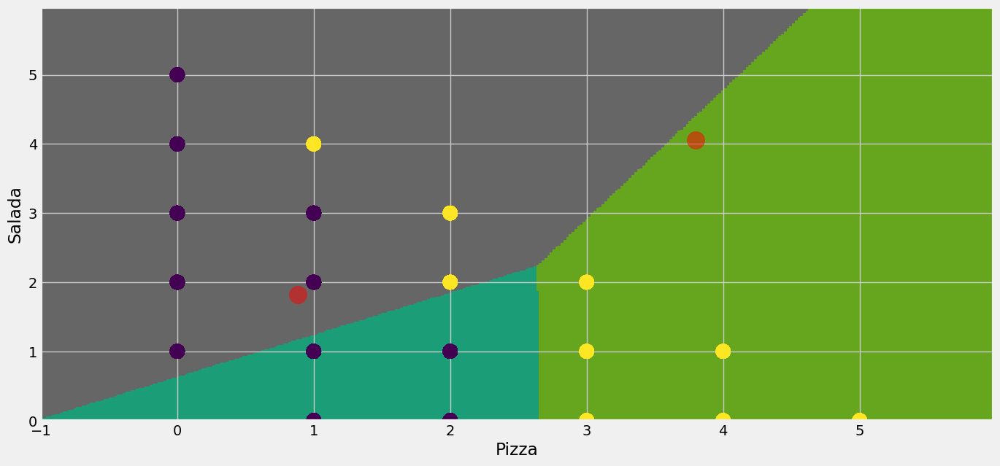

In [127]:
# Plot
# Parâmetros do Meshgrid
h = 0.02
x_min, x_max = X1[:, 0].min() - 1, X1[:, 0].max() + 1
y_min, y_max = X1[:, 1].min() - 1, X1[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = modelo_seg2.predict(np.c_[xx.ravel(), yy.ravel()])
plt.figure(1 , figsize = (15, 7) )
plt.clf()
Z = Z.reshape(xx.shape)

# Plot da imagem
plt.imshow(Z,
           interpolation = 'nearest',
           extent = (xx.min(), xx.max(), yy.min(), yy.max()),
           cmap = plt.cm.Dark2,
           aspect = 'auto',
           origin = 'lower')

# Plot dos pontos de dados
plt.scatter( x = 'pizza', y = 'salada', data = df_itens_index, c = labels1, s = 200 )
plt.scatter(x = centroides1[: , 0], y =  centroides1[: , 1], s = 300, c = 'red', alpha = 0.5)
plt.xlabel('Pizza')
plt.ylabel('Salada')
plt.show()

- Área cinza são os clientes que pediram menos pizzas e mais saladas;
- Área verde escura são os clientes que pediram poucas pizzas e menos saladas;
- Área verde clara são os clientes que pediram mais pizzas e menos saladas.

### Parecer técnico
Os cluster 1 e 3 são de clientes com comportamento opostos. A equipe de marketing poderia concentrar os esforços nos clientes do cluster 2, pois são os clietnes que compram Pizzas e Saladas e, portanto, tendem a consumir mais itens variados, evitando manter os estoques cheios de um único item.

Ou então, concentrar os esforços nos cliente que consomem produtos que geram mais lucros. Teríamos que verificar qual item, Pizza ou Salada, é mais rentável.

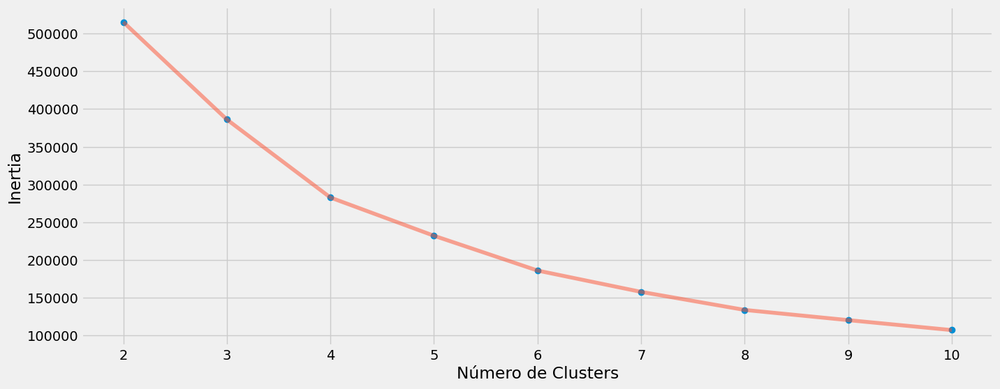

In [147]:
# Segmentação 3
X3 = df2[['pizza' , 'salada' , 'localidade']].iloc[: , :].values

# Lista de valores de Inertia (Inertia e WCSS são a mesma coisa)
inertia = []

# Loop para testar os valores de K
for n in range(2 , 11):
    modelo = (KMeans(n_clusters = n,
                     init = 'k-means++',
                     n_init = 10,
                     max_iter = 300,
                     tol = 0.0001,
                     random_state = 111,
                     algorithm = 'elkan'))
    modelo.fit(X3)
    inertia.append(modelo.inertia_)

# Plot
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(2 , 11) , inertia , 'o')
plt.plot(np.arange(2 , 11) , inertia , '-' , alpha = 0.5)
plt.xlabel('Número de Clusters') , plt.ylabel('Inertia')
plt.show()

In [148]:
# Criação do modelo com 4 clusters
modelo_seg3 = (KMeans(n_clusters = 4,
                      init = 'k-means++',
                      n_init = 10 ,
                      max_iter = 300,
                      tol = 0.0001,
                      random_state = 111  ,
                      algorithm = 'elkan') )

# Treinamento do modelo
modelo_seg3.fit(X1)

# Labels
labels3 = modelo_seg3.labels_

# Centróides
centroids3 = modelo_seg3.cluster_centers_

In [149]:
# Instala o Plotly
!pip install -q plotly

In [150]:
# Pacotes para o gráfico 3D
import plotly as py
import plotly.graph_objs as go
py.offline.init_notebook_mode(connected = True)

In [ ]:
# Plot
# Gráfico 3D
grafico = go.Scatter3d(x = df2['pizza'],
                       y = df2['salada'],
                       z = df2['localidade'],
                       mode = 'markers',
                       marker = dict(color = labels3,
                                     size = 4,
                                     line = dict(color = labels3, width = 15),
                                     opacity = 0.7))

# Layout do gráfico
layout = go.Layout(title = 'Clusters',
                   scene = dict(xaxis = dict(title  = 'Pizza'),
                                yaxis = dict(title  = 'Salada'),
                                zaxis = dict(title  = 'Localidade')))

# Plot da figura (gráfico + layout)
fig = go.Figure(data = grafico, layout = layout)
py.offline.iplot(fig)

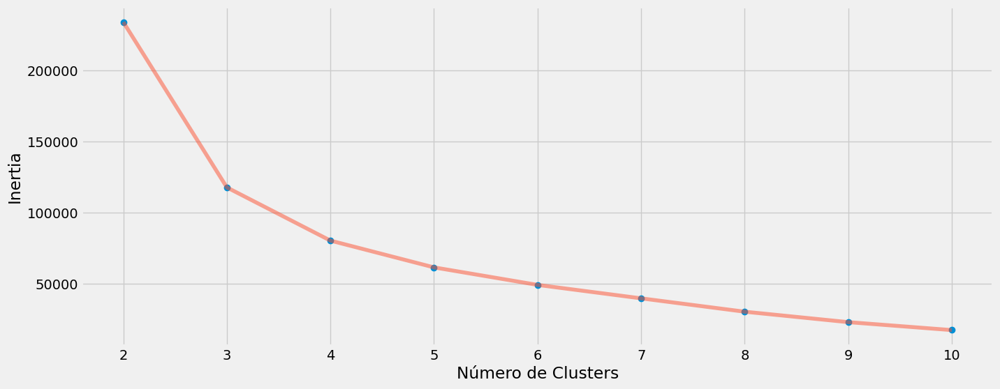

In [156]:
# Segmentação 4
# Usaremos três variáveis
X4 = df2[['pizza' , 'salada' , 'sobremesa']].iloc[: , :].values

# Lista de valores de Inertia (Inertia e WCSS são a mesma coisa)
inertia = []

# Loop para testar os valores de K
for n in range(2 , 11):
    modelo = (KMeans(n_clusters = n,
                     init = 'k-means++',
                     n_init = 10,
                     max_iter = 300,
                     tol = 0.0001,
                     random_state = 111,
                     algorithm = 'elkan'))
    modelo.fit(X4)
    inertia.append(modelo.inertia_)

# Plot
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(2 , 11) , inertia , 'o')
plt.plot(np.arange(2 , 11) , inertia , '-' , alpha = 0.5)
plt.xlabel('Número de Clusters') , plt.ylabel('Inertia')
plt.show()

In [157]:
# Segmentação 4
modelo_seg4 = (KMeans(n_clusters = 2,
                      init = 'k-means++',
                      n_init = 10 ,
                      max_iter = 300,
                      tol = 0.0001,
                      random_state = 111  ,
                      algorithm = 'elkan') )

# Treinamento do modelo
modelo_seg4.fit(X4)

# Labels
labels4 = modelo_seg4.labels_

# Centróides
centroids4 = modelo_seg4.cluster_centers_

In [158]:
# Plot
# Gráfico 3D
grafico = go.Scatter3d(x = df2['pizza'],
                       y = df2['salada'],
                       z = df2['sobremesa'],
                       mode = 'markers',
                       marker = dict(color = labels4,
                                     size = 4,
                                     line = dict(color = labels4, width = 15),
                                     opacity = 0.7))

# Layout do gráfico
layout = go.Layout(title = 'Clusters',
                   scene = dict(xaxis = dict(title  = 'Pizza'),
                                yaxis = dict(title  = 'Salada'),
                                zaxis = dict(title  = 'Sobremesa')))

# Plot da figura (gráfico + layout)
fig = go.Figure(data = grafico, layout = layout)
py.offline.iplot(fig)

In [159]:
# Converte o array para dataframe
df_labels = pd.DataFrame(labels4)

In [160]:
# Visualiza
df_labels.head(5)

,0
0,0
1,0
2,1
3,0
4,1


In [161]:
# Vamos fazer o merge de df2 e os labels (clusters) encontrados pelo modelo
# usaremos somente 3 variáveis para criar a segmentação
df_final = df2.merge(df_labels, left_index = True, right_index = True)

In [162]:
# Visualiza
df_final

,index,bebida,pizza,sobremesa,salada,localidade,0
0,0,0,1,1,0,9,0
1,1,0,2,2,0,6,0
2,2,4,4,5,1,9,1
3,3,0,1,1,0,6,0
4,4,3,3,3,0,2,1
...,...,...,...,...,...,...,...
99995,99995,4,4,4,0,4,1
99996,99996,0,1,1,0,2,0
99997,99997,1,1,1,0,2,0
99998,99998,0,2,2,0,3,0


In [163]:
# Ajusta o nome da coluna
df_final.rename(columns = {0:"cluster"}, inplace = True)

In [164]:
# Visualiza
df_final

,index,bebida,pizza,sobremesa,salada,localidade,cluster
0,0,0,1,1,0,9,0
1,1,0,2,2,0,6,0
2,2,4,4,5,1,9,1
3,3,0,1,1,0,6,0
4,4,3,3,3,0,2,1
...,...,...,...,...,...,...,...
99995,99995,4,4,4,0,4,1
99996,99996,0,1,1,0,2,0
99997,99997,1,1,1,0,2,0
99998,99998,0,2,2,0,3,0


Finalizado! Agora o dataframe já está no formato ideal para ser fornecido ao setor de marketing para ser aplicados as campanhas segmentadas de acordo com os perfis dos clusters.